In [1]:
import pandas as pd
import numpy as np
from itertools import combinations, product, permutations
import warnings
import time
import sys
import itertools
import csv
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
def get_D_l(Q, l):
    # Get the total number of rows
    J = Q.shape[0]
    
    # Create an empty list to store the resulting vectors
    D_l = []
    
    # Generate all combinations of l rows
    for row_indices in combinations(range(J), l):
        # Select the rows specified by the current combination
        rows = Q[row_indices, :]
        
        # Perform the bitwise OR operation on the selected rows and add the result to D_l
        D_l.append(np.bitwise_or.reduce(rows, axis=0))
    
    # Convert D_l to a NumPy array
    D_l = np.array(D_l)
    
    return D_l
def get_D(Q):
    # Get the total number of rows
    J = Q.shape[0]
    D = set()
    for l in range(1, J+1):
        # Generate all combinations of l rows
        for row_indices in combinations(range(J), l):
            # Select the rows specified by the current combination
            rows = Q[row_indices, :]

            # Perform the bitwise OR operation on the selected rows and add the result to D_l
            D.add(tuple(np.bitwise_or.reduce(rows, axis=0)))
    
    return D

In [19]:
# Define the dimensions of the binary matrix
J = 8
K = 4
C = 3
identifiable_Q = []

In [20]:
# Read the CSV file
df = pd.read_csv(f'enumerate_global_idQ_J{J}_K{K}_C{C}.csv', header=None)

# Initialize a list to store the binary matrices
identifiable_Q = []

# Convert each row into a binary matrix
for index, row in df.iterrows():
    binary_matrix = np.array(row).reshape(J, K)
    identifiable_Q.append(binary_matrix)

# Now, identifiable_Q is a list of binary matrices


In [18]:
len(identifiable_Q)

0

In [8]:
Q = identifiable_Q[0]
Q
get_D(Q)

{(0, 0, 0, 1),
 (0, 0, 1, 0),
 (0, 0, 1, 1),
 (0, 1, 0, 0),
 (0, 1, 0, 1),
 (0, 1, 1, 0),
 (0, 1, 1, 1),
 (1, 0, 0, 1),
 (1, 0, 1, 0),
 (1, 0, 1, 1),
 (1, 1, 0, 1),
 (1, 1, 1, 0),
 (1, 1, 1, 1)}

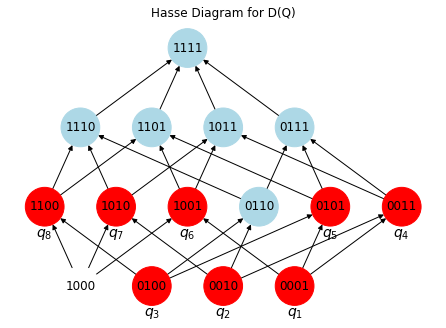

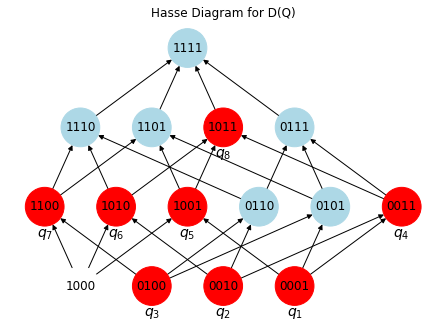

In [28]:
df1 = pd.read_csv(f'enumerate_global_idQ_J{J}_K{K}_C{1}.csv', header=None)
identifiable_Q_C1 = []
# Convert each row into a binary matrix
for index, row in df1.iterrows():
    binary_matrix = np.array(row).reshape(J, K)
    identifiable_Q_C1.append(binary_matrix)

for Q in identifiable_Q_C1:
    draw_hasse_diagram(Q)

In [22]:
def draw_hasse_diagram(Q):
    # Define node positions
    positions = {
        '1000': (2,2), '0100': (4,2), '0010': (6,2), '0001': (8,2),
        '1100': (1,4), '1010': (3,4), '1001': (5,4), '0110': (7,4), '0101': (9,4), '0011': (11,4),
        '1110': (2,6), '1101': (4,6), '1011': (6,6), '0111': (8,6),
        '1111': (5,8)
    }

    # Create graph
    G = nx.DiGraph()

    # Add nodes to the graph
    for node in positions.keys():
        G.add_node(node)

    # Define edges
    edges = [
        ('1000', '1100'), ('1000', '1010'), ('1000', '1001'),
        ('0100', '1100'), ('0100', '0110'), ('0100', '0101'),
        ('0010', '1010'), ('0010', '0110'), ('0010', '0011'),
        ('0001', '1001'), ('0001', '0101'), ('0001', '0011'),
        ('1100', '1110'), ('1100', '1101'),
        ('1010', '1110'), ('1010', '1011'),
        ('1001', '1101'), ('1001', '1011'),
        ('0110', '1110'), ('0110', '0111'),
        ('0101', '1101'), ('0101', '0111'),
        ('0011', '1011'), ('0011', '0111'),
        ('1110', '1111'),
        ('1101', '1111'),
        ('1011', '1111'),
        ('0111', '1111')
    ]

    # Add edges to the graph
    G.add_edges_from(edges)

    # Convert Q to a list of strings
    Q_str = ["".join(map(str, row)) for row in Q.tolist()]
    DQ = ["".join(map(str, row)) for row in get_D(Q)]
    
    # Define node colors
    node_colors = ['red' if node in Q_str else 'lightblue' if node in DQ else 'white' for node in G.nodes()]

    # Draw the graph
    nx.draw(G, pos=positions, with_labels=True, node_color=node_colors, node_size=1500)

    # Add text "q_i" beneath each node in Q_str
    for i, node in enumerate(Q_str, 1):
        plt.text(positions[node][0], positions[node][1] - 0.75, f'$q_{i}$', horizontalalignment='center', fontsize=14)

    plt.title('Hasse Diagram for D(Q)')
    plt.show()

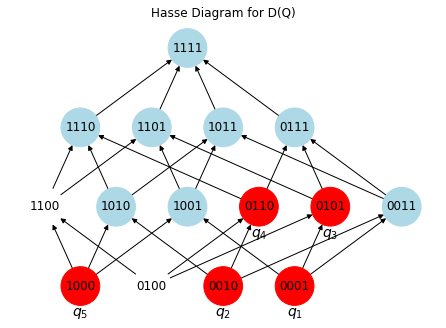

In [84]:
draw_hasse_diagram(Q)

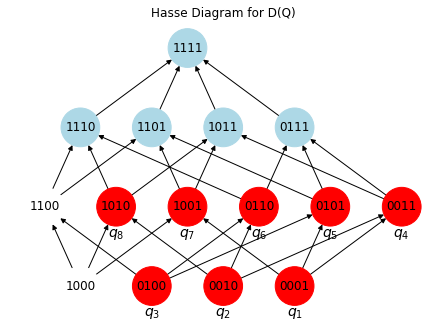

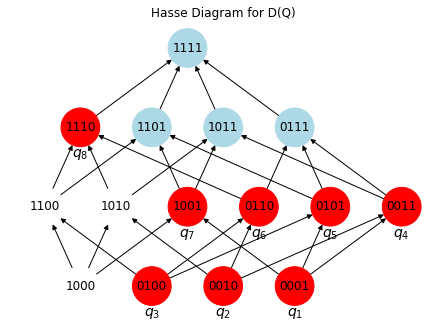

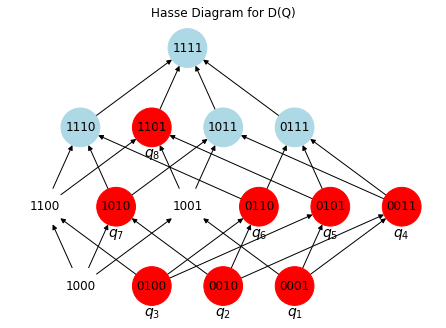

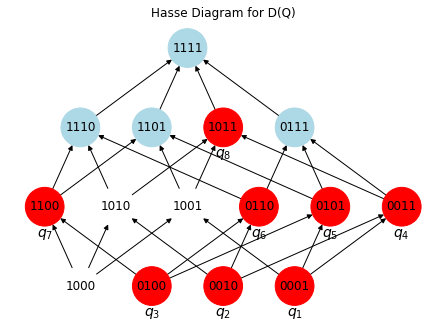

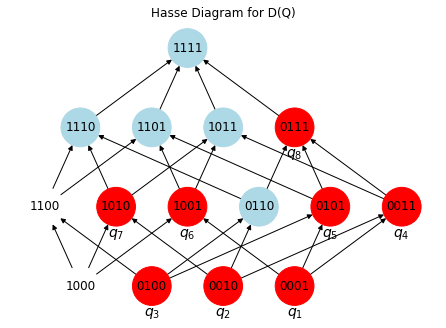

...

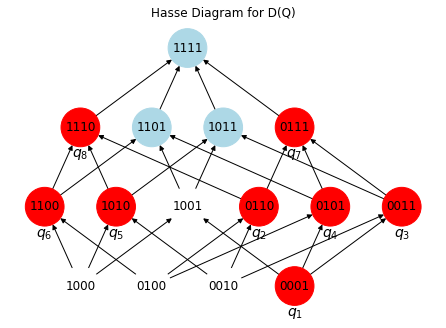

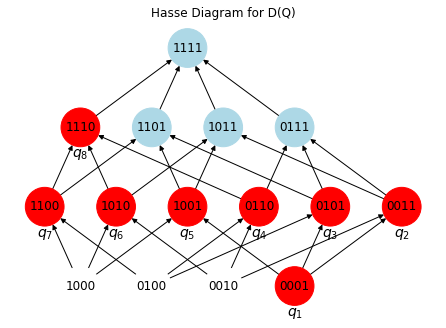

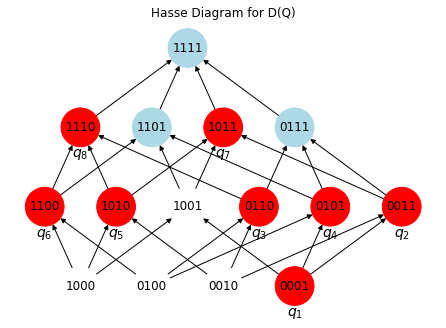

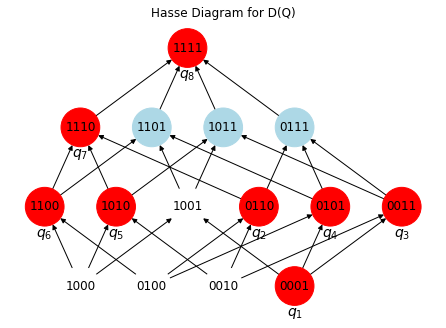

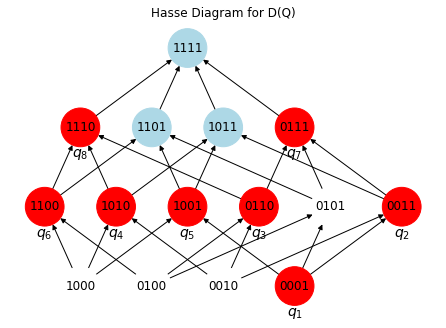

In [23]:
for Q in identifiable_Q:
    draw_hasse_diagram(Q)

In [49]:
def is_less_equal_than(row1, row2):
    return np.all(row1 <= row2)

In [9]:
def T_mat(Q):
    J, K = Q.shape
    pp = [seq for seq in itertools.product([0, 1], repeat=K)]
    TT = []
    TT.append([1]*(2**K))
    for l in range(1, J+1):
        Dl = get_D_l(Q, l)
        for item in Dl:
            TT.append((list(np.all(item <= p) for p in pp)))
    return np.array(TT)

def column_rank_T_mat(Q):
    TT = T_mat(Q)
    return(np.linalg.matrix_rank(TT))

In [15]:
for Q in identifiable_Q[1:10]:
    print(Q)
    print(T_mat(Q))
    print(column_rank_T_mat(Q))

[[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 1 0 1]
 [0 1 1 0]
 [1 0 0 1]
 [1 1 1 0]]
[[1 1 1 ... 1 1 1]
 [0 1 0 ... 1 0 1]
 [0 0 1 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]]
13
[[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 1 0 1]
 [0 1 1 0]
 [1 0 1 0]
 [1 1 0 1]]
[[1 1 1 ... 1 1 1]
 [0 1 0 ... 1 0 1]
 [0 0 1 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]]
13
[[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 1 0 1]
 [0 1 1 0]
 [1 1 0 0]
 [1 0 1 1]]
[[1 1 1 ... 1 1 1]
 [0 1 0 ... 1 0 1]
 [0 0 1 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]]
13
[[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 1 0 1]
 [1 0 0 1]
 [1 0 1 0]
 [0 1 1 1]]
[[1 1 1 ... 1 1 1]
 [0 1 0 ... 1 0 1]
 [0 0 1 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]]
14
[[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 1 0 1]
 [1 0 0 1]
 [0 1 1 1]
 [1 1 1 0]]
[[1 1 1 ... 1 1 1]
 [0 1 0 ... 1 0 1]
 [0 0 1 ... 0 1 1]
 ...
 

In [13]:
np.eye(4).astype(int)

array([[1, 0, 0, 0],
       [0, 1, 0, 0],
       [0, 0, 1, 0],
       [0, 0, 0, 1]])

In [12]:
T_mat(np.eye(4).astype(int))

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]])

In [11]:
column_rank_T_mat(np.eye(4).astype(int))

16

In [21]:
import numpy as np

def is_full_column_rank_after_removing_identical_columns(matrix):
    """
    This function takes a binary matrix as input,
    removes identical columns, and then checks if the resulting matrix
    is of full column rank.
    
    Parameters:
        matrix (numpy.ndarray): The input binary matrix.
        
    Returns:
        bool: True if the matrix is of full column rank after removing identical columns,
              False otherwise.
    """
    # Remove identical columns by finding unique columns
    unique_columns = np.unique(matrix, axis=1)
    
    # Compute the rank of the matrix with unique columns
    rank = np.linalg.matrix_rank(unique_columns)
    
    # Check if the rank is equal to the number of columns of the unique_columns matrix
    return rank == unique_columns.shape[1]

# Test the function
test_matrix = np.array([[1, 0, 1, 1, 0],
                        [0, 1, 0, 0, 1],
                        [1, 1, 1, 1, 1]])

is_full_column_rank_after_removing_identical_columns(test_matrix)


True

In [22]:
for Q in identifiable_Q:
#     print(Q)
#     print(T_mat(Q))
    print(is_full_column_rank_after_removing_identical_columns(Q))

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
